In [1]:
!nvidia-smi

Wed May  1 22:42:00 2024       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 525.89.02    Driver Version: 525.89.02    CUDA Version: 12.0     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  NVIDIA A100-PCI...  On   | 00000000:17:00.0 Off |                    0 |
| N/A   26C    P0    31W / 250W |      0MiB / 40960MiB |      0%      Default |
|                               |                      |             Disabled |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [2]:
import os
import numpy as np
from PIL import Image as IM
import glob
import matplotlib.pyplot as plt
import os
import h5py  # Import HDF5 support
import keras
from keras import layers
import io
import imageio
from IPython.display import Image, display
from ipywidgets import widgets, Layout, HBox
import tensorflow as tf
from tensorflow.keras.utils import Sequence



2024-05-01 22:42:02.060762: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX512_VNNI
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-05-01 22:42:02.207850: I tensorflow/core/util/port.cc:104] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.


In [3]:
# fpath = '/projects/academic/courses/cse676s24/dsingh27/CVIP/CNNLSTM/dataset/dataset/preprocessed_data/preprocessed_dataResized100Frames.npy'
fpath = '/projects/academic/courses/cse676s24/dsingh27/CVIP/CNNLSTM/dataset/dataset/preprocessed_data/1003_500sec_8epoch.hdf5'
# dataset = np.load(fpath)

with h5py.File(fpath, 'r') as h5f:
    
    dataset = h5f['data'][:]

In [4]:
dataset.shape

(500, 8, 256, 256, 3)

In [6]:
# dataset = dataset[:100]

In [9]:
# # Generate an array of indices and shuffle it
# indicesTemp = np.arange(len(dataset))
# np.random.shuffle(indicesTemp)

# # Select the first 500 indices from the shuffled array
# selected_indices = indicesTemp[:400]

# # Create a new dataset with these selected indices
# datasetCopy = dataset[selected_indices]

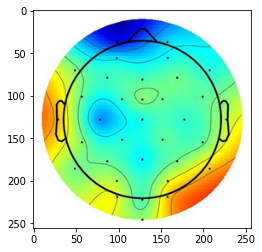

In [5]:
plt.imshow(dataset[1][5])


In [6]:
dataset.shape, dataset[0].shape

((500, 8, 256, 256, 3), (8, 256, 256, 3))

In [7]:
np.max(dataset)

1.0

In [10]:
# dataset = dataset.astype('float32') / 255.0
# batch_size = 25
# for start in range(0, dataset.shape[0], batch_size):
#     end = start + batch_size
#     dataset[start:end][:] = (dataset[start:end][:]).astype('float32') / 255.0

In [8]:
indexes = np.arange(dataset.shape[0])
np.random.shuffle(indexes)

In [9]:
train_index = indexes[:int(0.8 * len(dataset))]
val_index = indexes[int(0.8 * len(dataset)): int(0.9 * len(dataset))]
test_index = indexes[int(0.9 * len(dataset)):]

In [10]:
def create_shifted_frames(data):
    x = data[:, :-1, :, :, :]
    y = data[:, 1:, :, :, :]
    return x, y

# def create_shifted_frames(data):
#     x = data[:, :-8, :, :, :]
#     y = data[:, 8:, :, :, :]
#     return x, y

In [11]:
class DataGenerator(Sequence):
    def __init__(self, file_path, dataset_name, indexes, batch_size=1):
        self.file_path = file_path
        self.dataset_name = dataset_name
        self.indexes = indexes
        self.batch_size = batch_size

    def __len__(self):
        # Return the number of batches per epoch
        return int(np.ceil(len(self.indexes) / self.batch_size))

    def __getitem__(self, index):
        # Generate one batch of data
        start = index * self.batch_size
        end = min((index + 1) * self.batch_size, len(self.indexes))
        batch_indexes = self.indexes[start:end]
        
        # Initialize arrays for X (features) and y (labels)
        x, y = [], []
        with h5py.File(self.file_path, 'r') as f:
            # Extract a batch of data using the specified indexes
            batch = f[self.dataset_name][batch_indexes]
            x, y = create_shifted_frames(batch)
        
        return np.array(x), np.array(y)

    def on_epoch_end(self):
        # Updates indexes after each epoch
        np.random.shuffle(self.indexes)


In [12]:
file_path2 = '/projects/academic/courses/cse676s24/dsingh27/CVIP/CNNLSTM/dataset/dataset/preprocessed_data/cleanedData500Best.hdf5'
data_name = 'cleaned_data'


In [13]:
# Save the dataset and indices to an HDF5 file
with h5py.File(file_path2, 'w') as f:
    # Create a dataset in the file for the main dataset
    f.create_dataset(data_name, data=dataset, compression='gzip')
    # Create datasets in the file for the indices
    f.create_dataset('train_index', data=train_index, compression='gzip')
    f.create_dataset('val_index', data=val_index, compression='gzip')
    f.create_dataset('test_index', data=test_index, compression='gzip')
    

In [14]:
    
# Load the indices from the HDF5 file
with h5py.File(file_path2, 'r') as f:
    train_index = f['train_index'][:]
    val_index = f['val_index'][:]
    test_index = f['test_index'][:]

# Instantiate the DataGenerators with the data name and indexes
train_generator = DataGenerator(file_path2, data_name, train_index, batch_size=1)
val_generator = DataGenerator(file_path2, data_name, val_index, batch_size=1)
test_generator = DataGenerator(file_path2, data_name, test_index, batch_size=1)

In [ ]:
# import tracemalloc

# # Start tracing the memory allocation
# tracemalloc.start()

# train_generator = DataGenerator(dataset[train_index], batch_size=1)
# val_generator = DataGenerator(dataset[val_index], batch_size=1)
# test_generator = DataGenerator(dataset[test_index], batch_size=1)

# snapshot = tracemalloc.take_snapshot()
# top_stats = snapshot.statistics('lineno')

# print("[ Top 10 ]")
# for stat in top_stats[:10]:
#     print(stat)

# # Stop the tracemalloc before ending the program
# tracemalloc.stop()

In [15]:
sample_batch_x, _ = train_generator[0]

In [21]:
import keras
from keras import layers
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau

def train_model(train_generator, val_generator, sample_batch_x):

    inp = layers.Input(shape=(None, *sample_batch_x.shape[2:]))


    x = layers.ConvLSTM2D(
        filters=64,
        kernel_size=(5, 5),
        padding="same",
        return_sequences=True,
        activation="relu",
    )(inp)
    x = layers.BatchNormalization()(x)
    x = layers.ConvLSTM2D(
        filters=64,
        kernel_size=(3, 3),
        padding="same",
        return_sequences=True,
        activation="relu",
    )(x)
    x = layers.BatchNormalization()(x)
    x = layers.ConvLSTM2D(
        filters=64,
        kernel_size=(1, 1),
        padding="same",
        return_sequences=True,
        activation="relu",
    )(x)
    x = layers.Conv3D(
        filters=3,
        kernel_size=(3, 3, 3),
        activation="sigmoid",
        padding="same"
    )(x)

    # Setup the model
    model = keras.models.Model(inputs=inp, outputs=x)
    model.compile(optimizer='adam', loss='mse')

    # Callbacks for saving the model and early stopping
    checkpoint_filepath = '/tmp/checkpoint'
    model_checkpoint_callback = ModelCheckpoint(
        filepath=checkpoint_filepath,
        save_weights_only=True,
        monitor='val_loss',
        mode='min',
        save_best_only=True)
    early_stopping_callback = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)
    reduce_lr_callback = ReduceLROnPlateau(monitor='val_loss', patience=3)

    # Train the model
    model.fit(
        train_generator,
        epochs=40,
        validation_data=val_generator,
        callbacks=[model_checkpoint_callback, early_stopping_callback, reduce_lr_callback]
    )
    return model

# Usage of the function to train the model
model = train_model(train_generator, val_generator, sample_batch_x)


2024-05-01 18:42:40.892637: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX512_VNNI
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-05-01 18:42:41.313794: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1613] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 38422 MB memory:  -> device: 0, name: NVIDIA A100-PCIE-40GB, pci bus id: 0000:17:00.0, compute capability: 8.0


Epoch 1/40


2024-05-01 18:42:54.866252: I tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:428] Loaded cuDNN version 8600
2024-05-01 18:43:03.173714: I tensorflow/compiler/xla/service/service.cc:173] XLA service 0x151bf6462970 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
2024-05-01 18:43:03.173802: I tensorflow/compiler/xla/service/service.cc:181]   StreamExecutor device (0): NVIDIA A100-PCIE-40GB, Compute Capability 8.0
2024-05-01 18:43:03.178549: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:268] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
2024-05-01 18:43:03.303684: I tensorflow/compiler/jit/xla_compilation_cache.cc:477] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


400/400 [==============================] - 599s 1s/step - loss: 0.0181 - val_loss: 0.0793 - lr: 0.0010
Epoch 2/40
400/400 [==============================] - 580s 1s/step - loss: 0.0104 - val_loss: 0.0121 - lr: 0.0010
Epoch 3/40
400/400 [==============================] - 581s 1s/step - loss: 0.0093 - val_loss: 0.0143 - lr: 0.0010
Epoch 4/40
400/400 [==============================] - 612s 2s/step - loss: 0.0088 - val_loss: 0.0099 - lr: 0.0010
Epoch 5/40
400/400 [==============================] - 611s 2s/step - loss: 0.0085 - val_loss: 0.0188 - lr: 0.0010
Epoch 6/40
400/400 [==============================] - 618s 2s/step - loss: 0.0084 - val_loss: 0.0101 - lr: 0.0010
Epoch 7/40
400/400 [==============================] - 686s 2s/step - loss: 0.0081 - val_loss: 0.0118 - lr: 0.0010
Epoch 8/40
400/400 [==============================] - 607s 2s/step - loss: 0.0074 - val_loss: 0.0089 - lr: 1.0000e-04
Epoch 9/40
400/400 [==============================] - 606s 2s/step - loss: 0.0074 - val_loss: 0

In [7]:
path_to_save_weights = 'CNNLSTM100Samplesv4_8Frames.h5'

# Save the model weights
model.save_weights(path_to_save_weights)

NameError: name 'model' is not defined

In [19]:
import keras
from keras import layers
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau

def create_model(sample_batch_x):
    inp = layers.Input(shape=(None, *sample_batch_x.shape[2:]))

    x = layers.ConvLSTM2D(
        filters=64,
        kernel_size=(5, 5),
        padding="same",
        return_sequences=True,
        activation="relu",
    )(inp)
    x = layers.BatchNormalization()(x)
    x = layers.ConvLSTM2D(
        filters=64,
        kernel_size=(3, 3),
        padding="same",
        return_sequences=True,
        activation="relu",
    )(x)
    x = layers.BatchNormalization()(x)
    x = layers.ConvLSTM2D(
        filters=64,
        kernel_size=(1, 1),
        padding="same",
        return_sequences=True,
        activation="relu",
    )(x)
    x = layers.Conv3D(
        filters=3,
        kernel_size=(3, 3, 3),
        activation="sigmoid",
        padding="same"
    )(x)

    model = keras.models.Model(inputs=inp, outputs=x)
    model.compile(optimizer='adam', loss='mse')

    return model

# Load the model with the same architecture
# sample_batch_x = None  # Make sure to set this with the correct shape that matches training
model = create_model(sample_batch_x)

# Path to your saved weights
path_to_saved_weights = 'CNNLSTM100Samplesv4_8Frames.h5'

# Load the weights
model.load_weights(path_to_saved_weights)

# Now your model is ready to make predictions


# Direct Brain Map for Binaural prediction for 1 second from model weights

In [20]:
test_x, test_y = next(iter(test_generator))
predictions = model.predict(test_x)

2024-05-01 22:57:37.319973: I tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:428] Loaded cuDNN version 8600


1/1 [==============================] - 10s 10s/step


# For the next time step the regenration of brain Map quality looks Good, but the contours are not as per the actual, but the quality becomes worse as we move forward to next timesteps

1/1 [==============================] - 0s 31ms/step


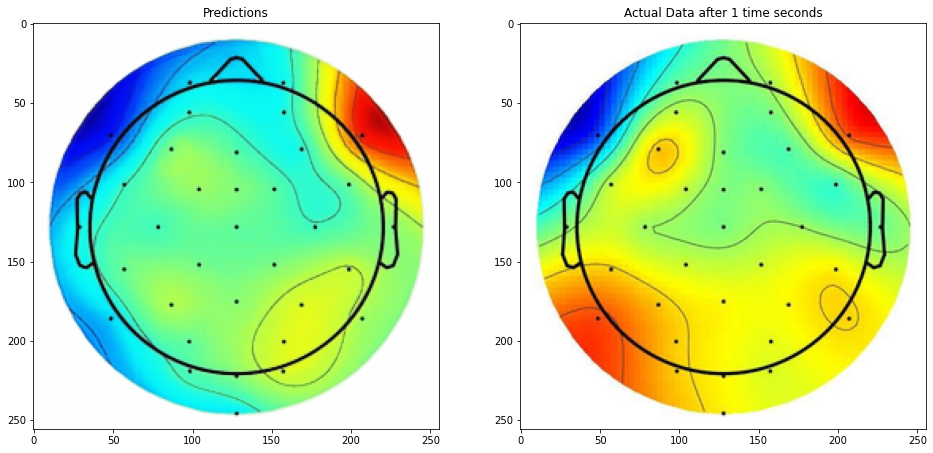

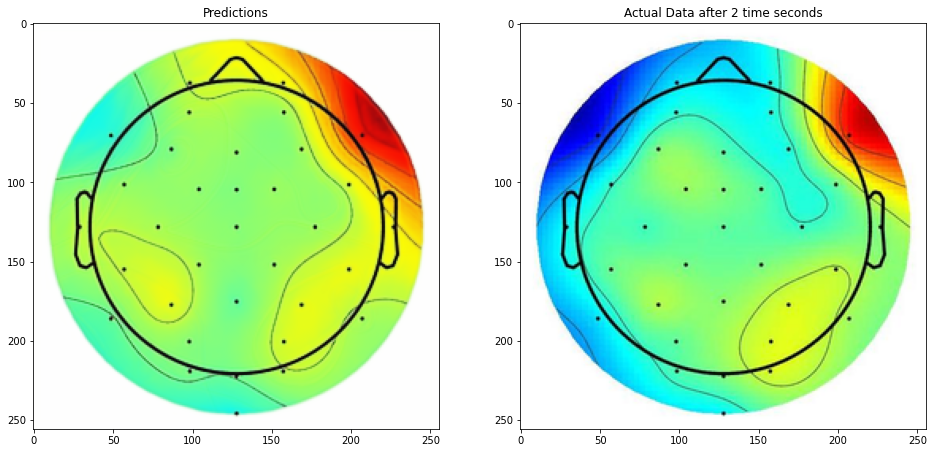

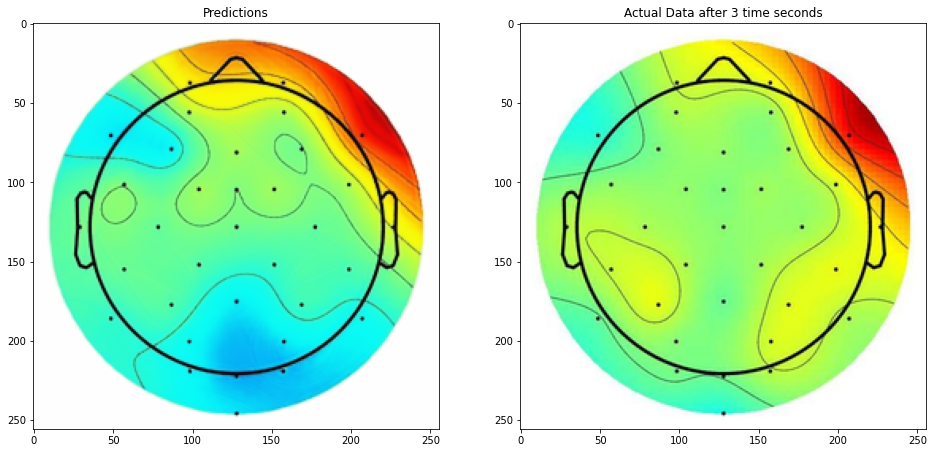

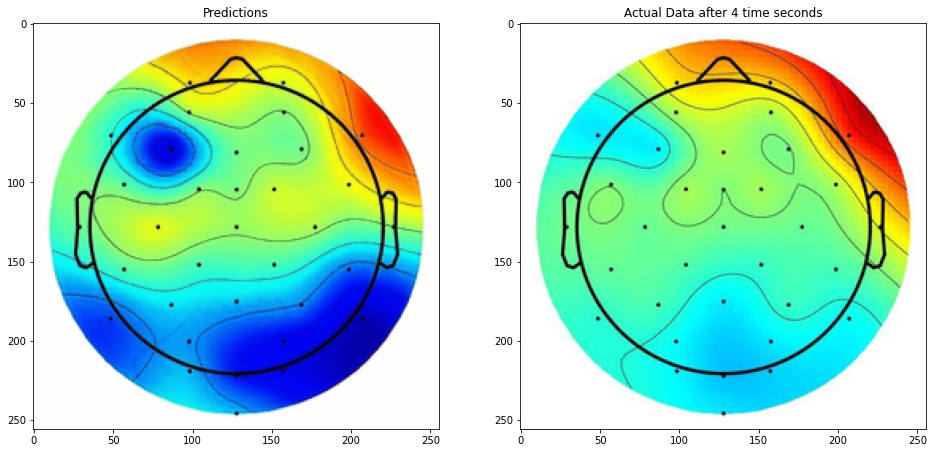

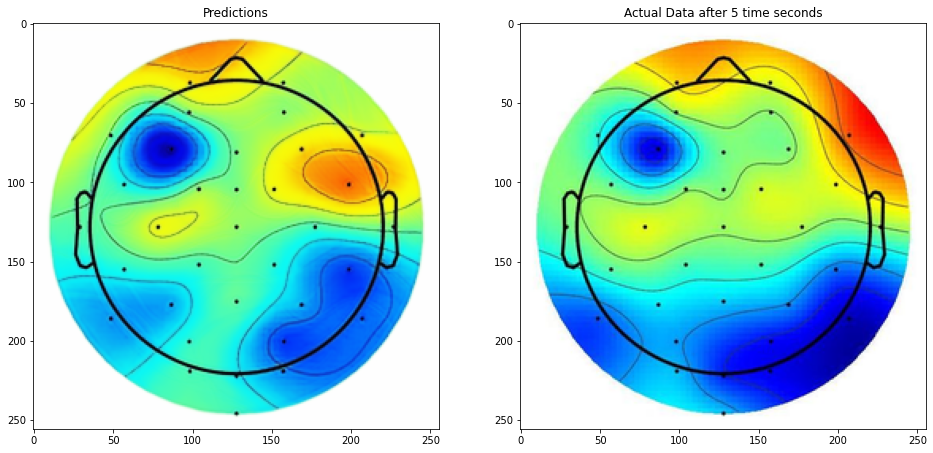

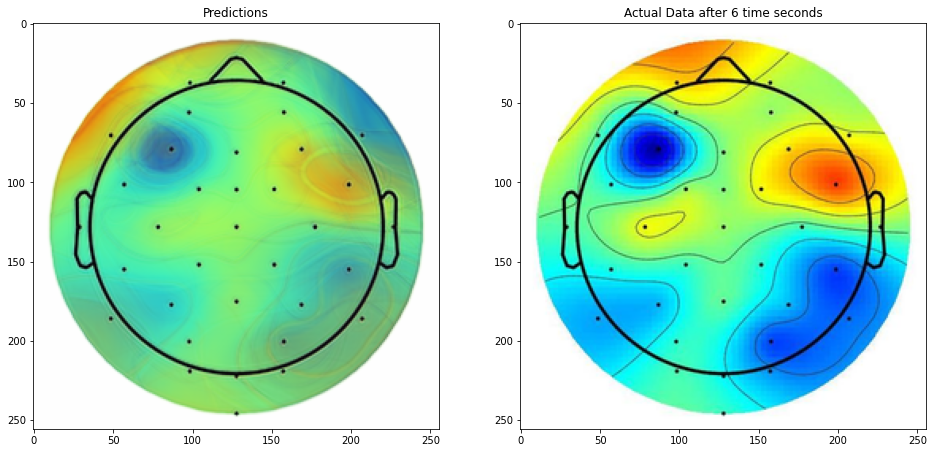

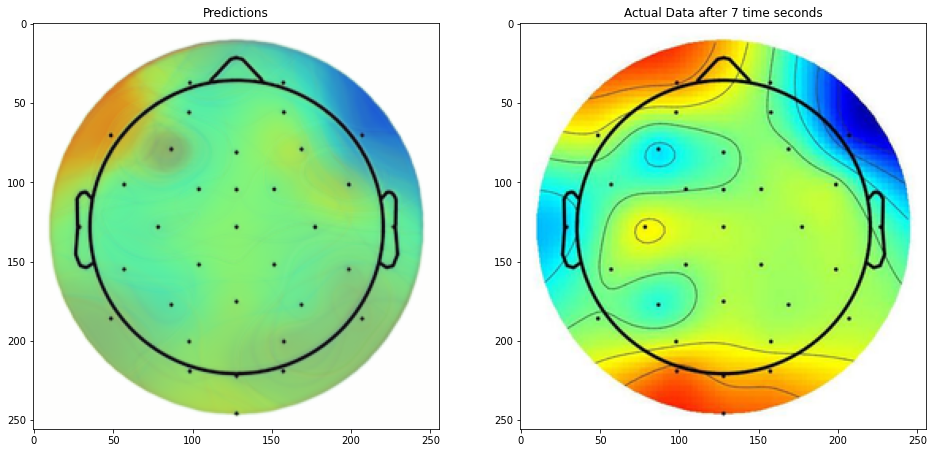

In [34]:
x = dataset[:, :-1, :, :, :]
y =  dataset[:, 1:, :, :, :]
reshaped_x = x[0].reshape((1, 7, 256, 256, 3))
reshaped_y = y[0].reshape((1, 7, 256, 256, 3))
pred = reshaped_x

for i in range(2):
    pred = model.predict(pred)
for i in range(7):
    fig, axs = plt.subplots(1, 2, figsize=(16, 8)) 
    
    axs[0].imshow(pred[0][i])
    axs[0].set_title('Predictions')
    
    axs[1].imshow(reshaped_y[0][i])
    axs[1].set_title(f'Actual Data after {i + 1} time seconds')
    
   
    plt.show()


# 7 timeseconds Brain Map prediction

In [23]:
test_x, test_y = next(iter(test_generator))
test_x.shape

(1, 7, 256, 256, 3)

In [24]:
test_y.shape

(1, 7, 256, 256, 3)

In [25]:
x = dataset[:, :-1, :, :, :]

In [26]:
reshaped_x = x[0].reshape((1, 7, 256, 256, 3))


In [27]:
reshaped_y = x[1].reshape((1, 7, 256, 256, 3))

In [28]:
pred = reshaped_x
# test_x, test_y = next(iter(test_generator))
# predictions = model.predict(test_x)
# pred = predictions
for i in range(1):
    pred = model.predict(pred)


1/1 [==============================] - 0s 43ms/step


In [29]:
pred.shape

(1, 7, 256, 256, 3)

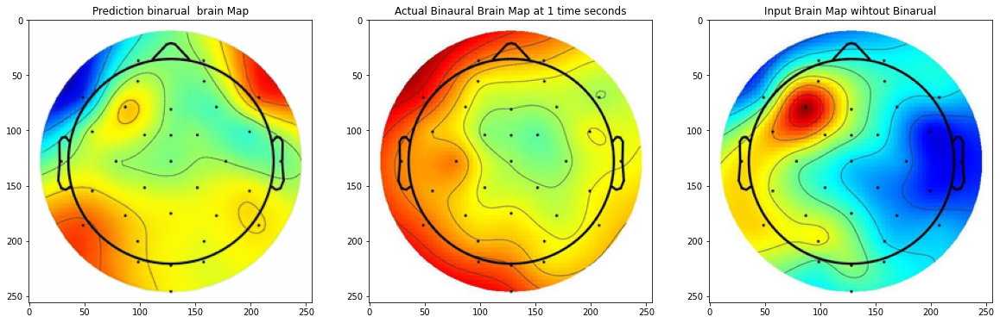

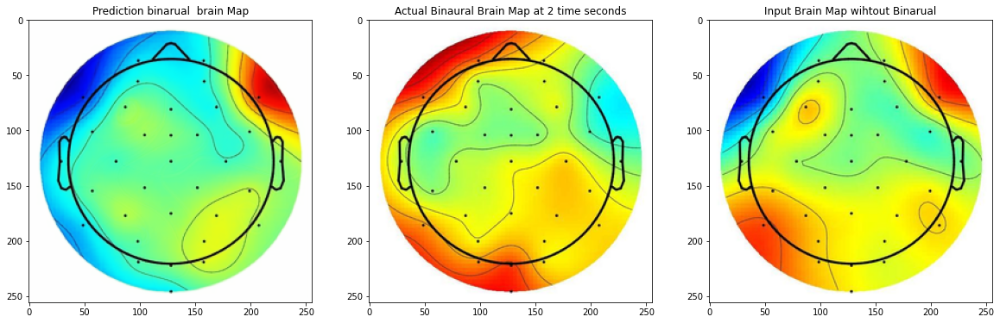

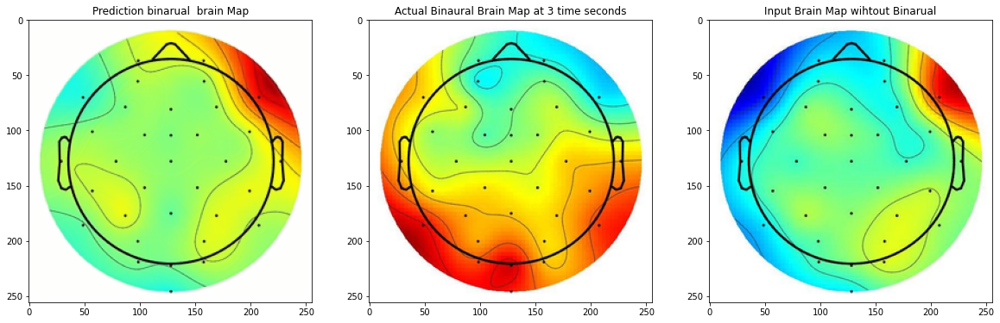

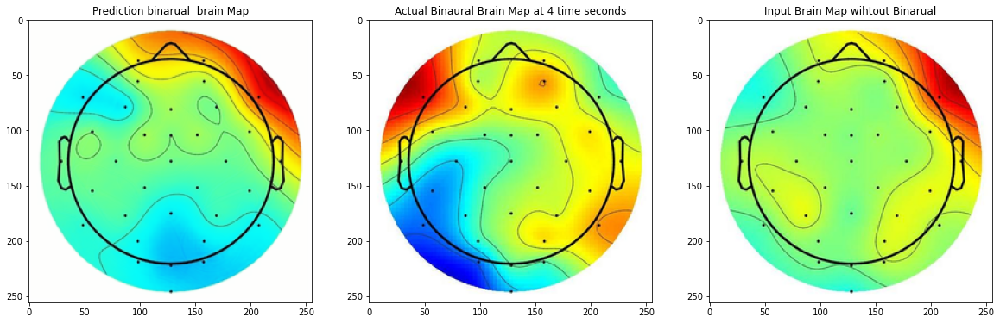

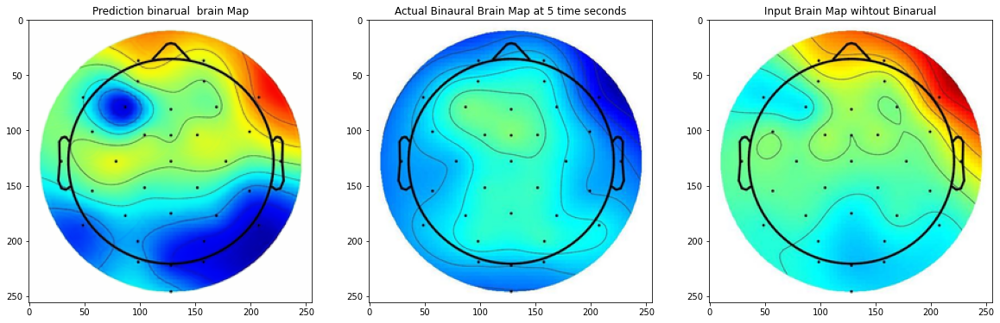

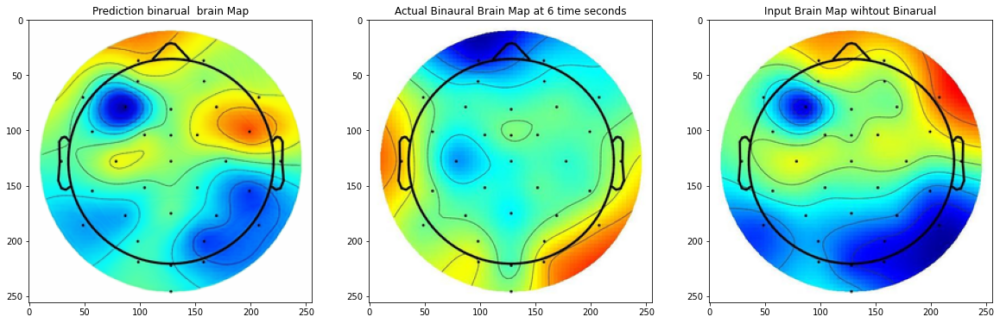

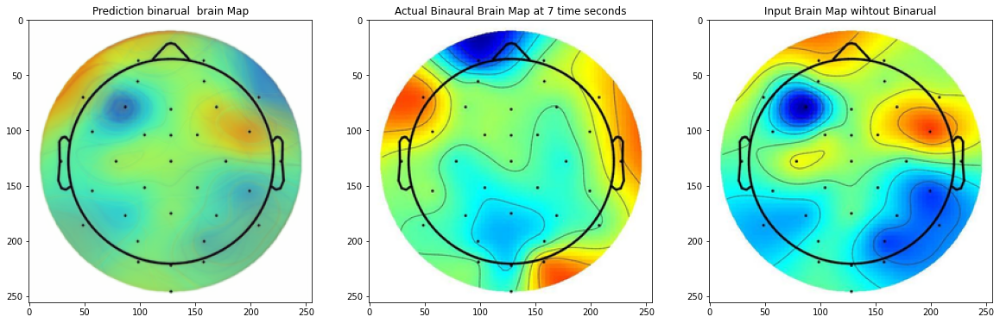

In [30]:

for i in range(7):
    fig, axs = plt.subplots(1, 3, figsize=(20, 10))  # Increase figure size here
    
    # Plot the first image (prediction) on the left
    axs[0].imshow(pred[0][i])
    axs[0].set_title('Prediction binarual  brain Map')
    
    # Plot the second image (actual data) in the middle
    axs[1].imshow(reshaped_y[0][i])
    axs[1].set_title(f'Actual Binaural Brain Map at {i + 1} time seconds')
    
    # Plot the third image (input data) on the right
    axs[2].imshow(reshaped_x[0][i])
    axs[2].set_title('Input Brain Map wihtout Binarual')
    
    plt.show()



1/1 [==============================] - 0s 32ms/step


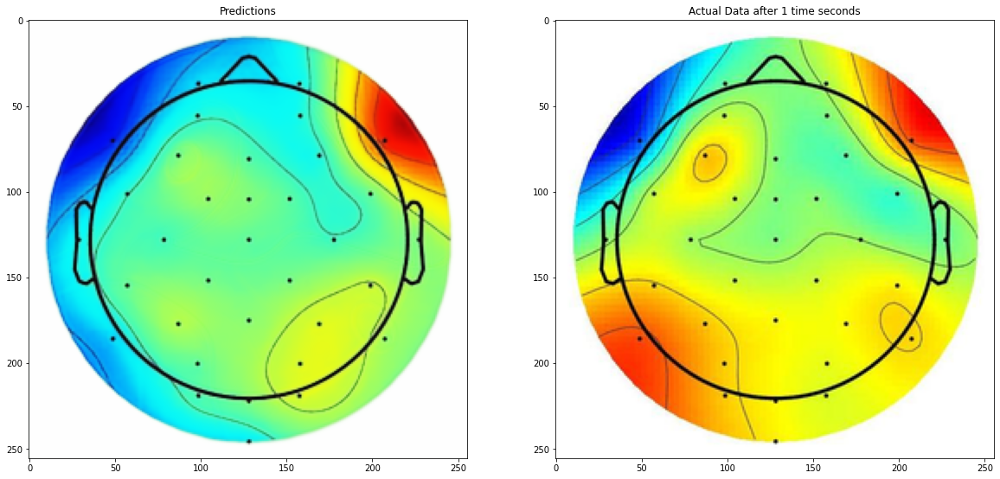

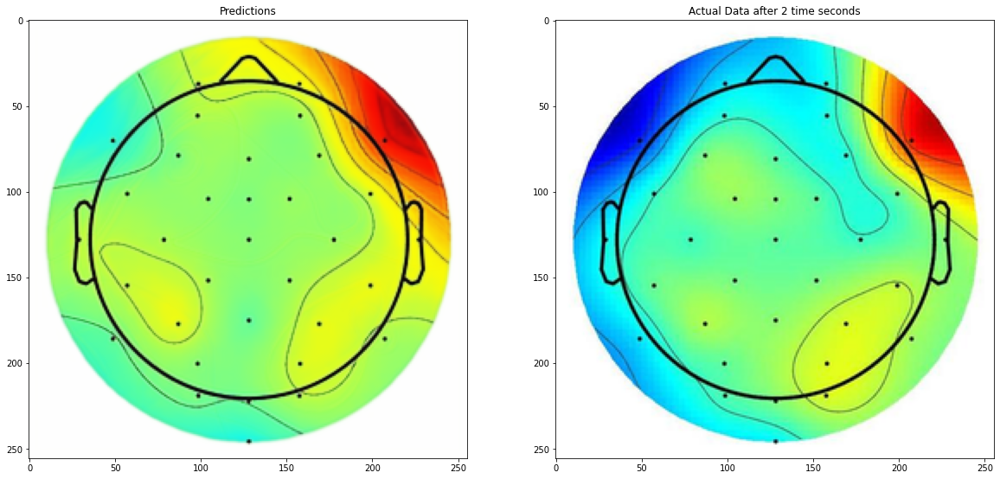

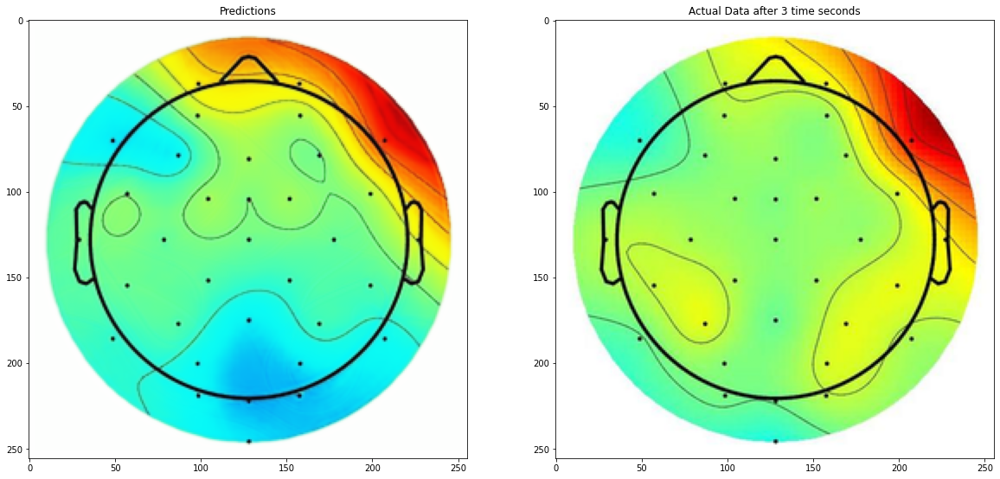

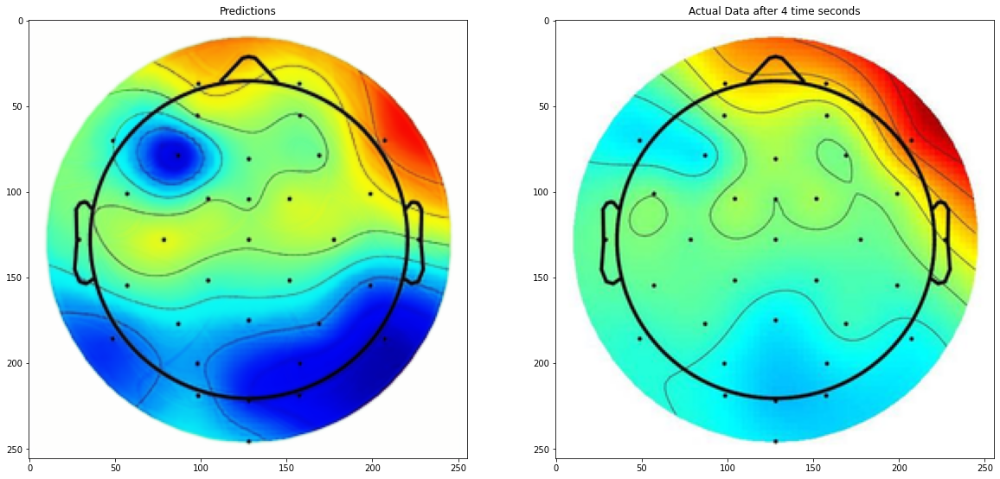

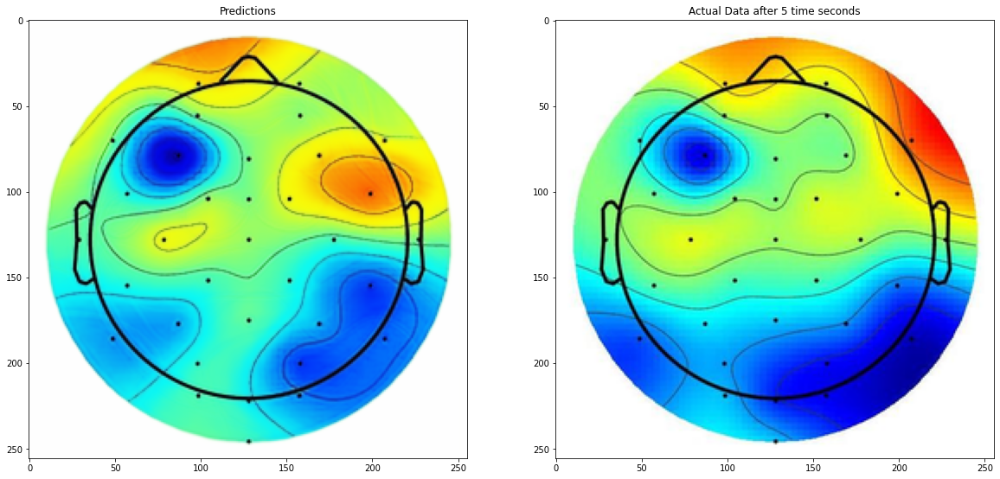

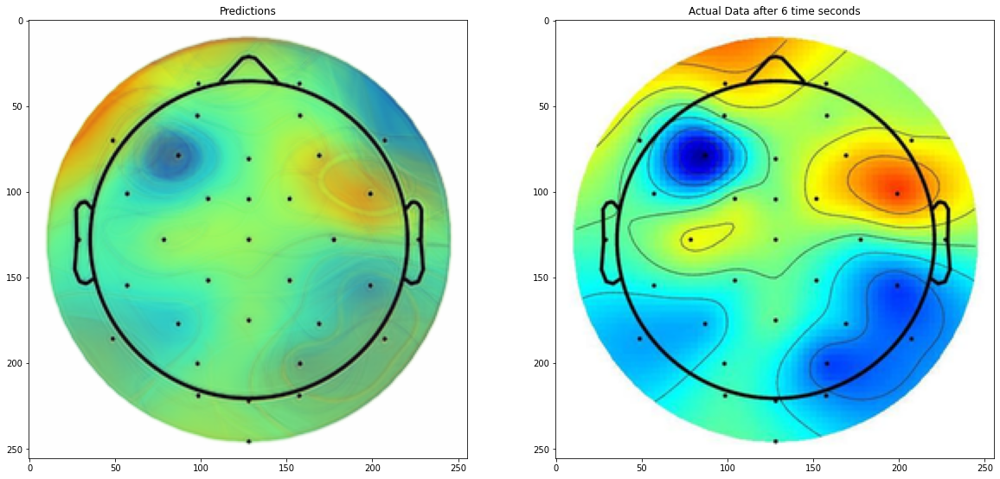

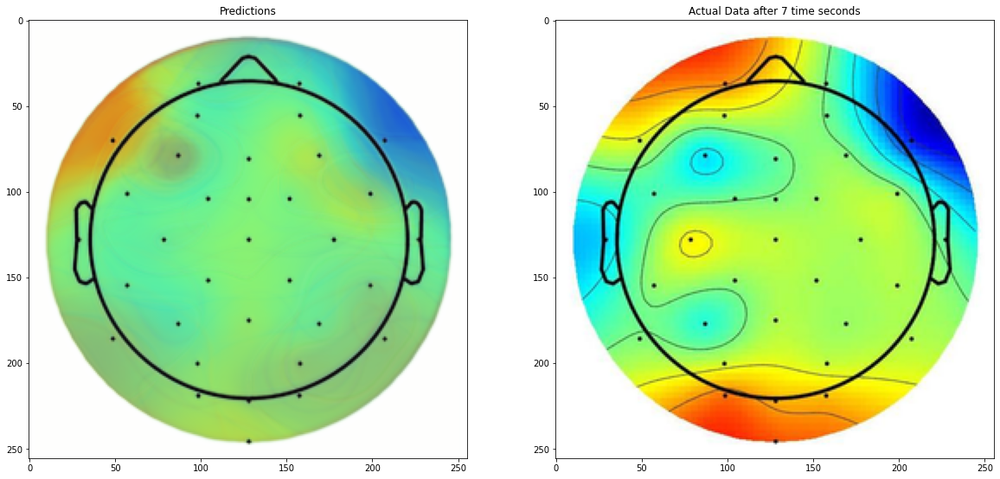

# Now looking closely at the below image, it can be seen that the model is predicting the same frame (look at the contour, the contour mapping is neraly same as the input Data), instead of predicting future timestamps. Major reason for this is that brain Map donot change significantly over time

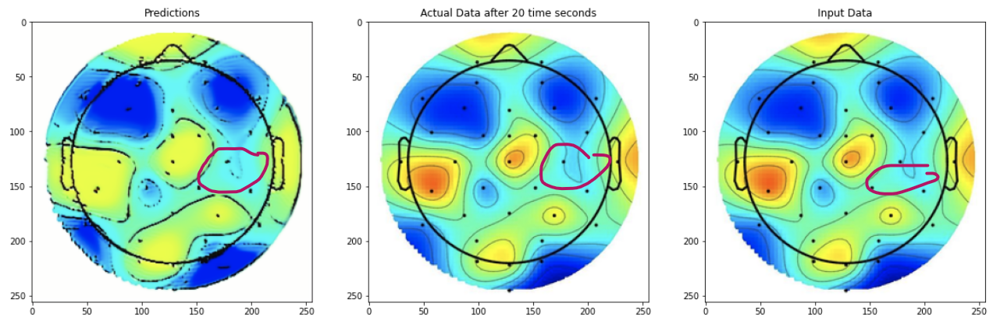

# We Tried implementing the same model by leveraging the Condtional GAN version referring to below paper. We observed the same issue that the image generated for next timestep remained same. Also there were significants artifacts getting generated in the model.
 https://medium.com/@jctestud/video-generation-with-pix2pix-aed5b1b69f57

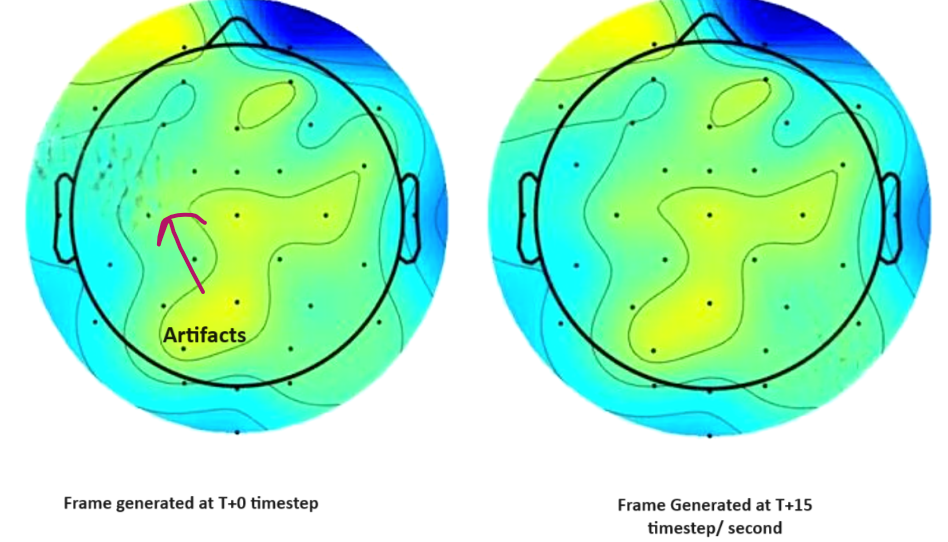